# Dataset Exploration Public Bike network in San Francisco
## by Miguel Granica

## Preliminary Wrangling

> In this investigation we will study the characteristics of the public bicycle network of the city of San Francisco. Allowing us to understand population circulation patterns. How often is this form of transport used? What are the busiest routes? Which stations have the most activity?

In [1]:
# import all packages and set plots to be embedded inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import zipfile
import requests
import os

%matplotlib inline

> The database contains the record of the trips made by bicycle in the city of San Francisco during the last 10 months. It has more than 2.5 million records. Which have temporal information and the georeferenced coordinates of the start and end stations of each route, allowing the establishment of paths and their respective duration. Finally, it provides us with user data, such as what type of subscription they have. the csv file with the gather data is attached with the documentation.

In [ ]:
urls  = ['https://s3.amazonaws.com/baywheels-data/202003-baywheels-tripdata.csv.zip',
         'https://s3.amazonaws.com/baywheels-data/202002-baywheels-tripdata.csv.zip',
         'https://s3.amazonaws.com/baywheels-data/202001-baywheels-tripdata.csv.zip',
         'https://s3.amazonaws.com/baywheels-data/201912-baywheels-tripdata.csv.zip',
         'https://s3.amazonaws.com/baywheels-data/201911-baywheels-tripdata.csv.zip',
         'https://s3.amazonaws.com/baywheels-data/201910-baywheels-tripdata.csv.zip',
         'https://s3.amazonaws.com/baywheels-data/201909-baywheels-tripdata.csv.zip',
         'https://s3.amazonaws.com/baywheels-data/201908-baywheels-tripdata.csv.zip',
         'https://s3.amazonaws.com/baywheels-data/201907-baywheels-tripdata.csv.zip',
         'https://s3.amazonaws.com/baywheels-data/201906-baywheels-tripdata.csv.zip',
         'https://s3.amazonaws.com/baywheels-data/201905-baywheels-tripdata.csv.zip',]

folder_name = 'data_base'
if not os.path.exists(folder_name):
    os.makedirs(folder_name)

for url in urls:
    
    response= requests.get(url)
    with open(os.path.join(folder_name,url.split('/')[-1]), mode='wb') as file:
        file.write(response.content)
        
os.listdir(folder_name)

In [ ]:
dataframes = [] 
file_folder = os.listdir(folder_name)

for file in file_folder:
    
    file_csv = file.replace('.zip','')
    with zipfile.ZipFile(os.path.join(folder_name, file),mode='r') as zip_file:
        df = pd.read_csv(zip_file.open(file_csv))
    dataframes.append(df)
    
df_bike = pd.concat(dataframes, ignore_index=True)

In [ ]:
df_bike.to_csv('ford_go_bike_system_data.csv', index=False)

In [41]:
df_bike = pd.read_csv('ford_go_bike_system_data.csv')

c:\program files\python38\lib\site-packages\IPython\core\interactiveshell.py:3062: DtypeWarning: Columns (13,14) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [42]:
df_bike.head(10)

,duration_sec,start_time,end_time,start_station_id,start_station_name,start_station_latitude,start_station_longitude,end_station_id,end_station_name,end_station_latitude,end_station_longitude,bike_id,user_type,bike_share_for_all_trip,rental_access_method
0,48877,2019-05-31 20:34:56.8110,2019-06-01 10:09:34.7960,321.0,5th St at Folsom,37.780146,-122.403071,60.0,8th St at Ringold St,37.774520,-122.409449,1416,Customer,No,NaN
1,47050,2019-05-31 19:43:56.1960,2019-06-01 08:48:06.9190,246.0,Berkeley Civic Center,37.869060,-122.270556,266.0,Parker St at Fulton St,37.862464,-122.264791,1797,Subscriber,No,NaN
2,5912,2019-05-31 23:54:24.0890,2019-06-01 01:32:56.9820,149.0,Emeryville Town Hall,37.831275,-122.285633,149.0,Emeryville Town Hall,37.831275,-122.285633,3612,Customer,No,NaN
3,2629,2019-05-31 23:59:57.4490,2019-06-01 00:43:46.8740,186.0,Lakeside Dr at 14th St,37.801319,-122.262642,186.0,Lakeside Dr at 14th St,37.801319,-122.262642,2333,Customer,No,NaN
4,4235,2019-05-31 23:05:48.9320,2019-06-01 00:16:24.4570,34.0,Father Alfred E Boeddeker Park,37.783988,-122.412408,368.0,Myrtle St at Polk St,37.785434,-122.419622,181,Subscriber,No,NaN
5,2954,2019-05-31 23:26:52.8120,2019-06-01 00:16:07.7250,50.0,2nd St at Townsend St,37.780526,-122.390288,6.0,The Embarcadero at Sansome St,37.804770,-122.403234,3264,Customer,No,NaN
6,3071,2019-05-31 23:24:40.2500,2019-06-01 00:15:51.3030,50.0,2nd St at Townsend St,37.780526,-122.390288,6.0,The Embarcadero at Sansome St,37.804770,-122.403234,1566,Customer,No,NaN
7,924,2019-05-31 23:58:16.1120,2019-06-01 00:13:40.5880,324.0,Union Square (Powell St at Post St),37.788300,-122.408531,50.0,2nd St at Townsend St,37.780526,-122.390288,1649,Subscriber,No,NaN
8,696,2019-05-31 23:57:58.1300,2019-06-01 00:09:35.0770,22.0,Howard St at Beale St,37.789756,-122.394643,81.0,Berry St at 4th St,37.775880,-122.393170,2832,Subscriber,No,NaN
9,510,2019-05-31 23:54:52.5790,2019-06-01 00:03:23.3450,211.0,Broadway at 40th St,37.827757,-122.256716,181.0,Grand Ave at Webster St,37.811377,-122.265192,81,Subscriber,Yes,NaN


In [43]:
df_bike.shape

(2541086, 15)

In [44]:
df_bike.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2541086 entries, 0 to 2541085
Data columns (total 15 columns):
 #   Column                   Dtype  
---  ------                   -----  
 0   duration_sec             int64  
 1   start_time               object 
 2   end_time                 object 
 3   start_station_id         float64
 4   start_station_name       object 
 5   start_station_latitude   float64
 6   start_station_longitude  float64
 7   end_station_id           float64
 8   end_station_name         object 
 9   end_station_latitude     float64
 10  end_station_longitude    float64
 11  bike_id                  int64  
 12  user_type                object 
 13  bike_share_for_all_trip  object 
 14  rental_access_method     object 
dtypes: float64(6), int64(2), object(7)
memory usage: 290.8+ MB


In [45]:
df_bike.nunique()

duration_sec                 14257
start_time                 2479529
end_time                   2479195
start_station_id               454
start_station_name             471
start_station_latitude      319511
start_station_longitude     339224
end_station_id                 455
end_station_name               472
end_station_latitude        322389
end_station_longitude       343096
bike_id                      12039
user_type                        2
bike_share_for_all_trip          2
rental_access_method             2
dtype: int64

In [46]:
list(df_bike.columns)

['duration_sec',
 'start_time',
 'end_time',
 'start_station_id',
 'start_station_name',
 'start_station_latitude',
 'start_station_longitude',
 'end_station_id',
 'end_station_name',
 'end_station_latitude',
 'end_station_longitude',
 'bike_id',
 'user_type',
 'bike_share_for_all_trip',
 'rental_access_method']

In [47]:
df_nulls = []
for column in list(df_bike.columns):
    null_val = df_bike[column].isna().sum()
    df_nulls.append({'column' : column,
                    'nulls' : null_val})
pd.DataFrame(df_nulls)

,column,nulls
0,duration_sec,0
1,start_time,0
2,end_time,0
3,start_station_id,566306
4,start_station_name,564472
5,start_station_latitude,0
6,start_station_longitude,0
7,end_station_id,567954
8,end_station_name,566128
9,end_station_latitude,0


In [48]:
df_bike.bike_share_for_all_trip.value_counts()

No     1291659
Yes     101161
Name: bike_share_for_all_trip, dtype: int64

In [49]:
df_bike.user_type.value_counts()

Subscriber    1811066
Customer       730020
Name: user_type, dtype: int64

In [50]:
df_bike.start_time = pd.to_datetime(df_bike.start_time, yearfirst=True)
df_bike.end_time = pd.to_datetime(df_bike.end_time, yearfirst=True)

In [51]:
df_bike.describe().T

,count,mean,std,min,25%,50%,75%,max
duration_sec,2541086.0,817.959158,1890.797887,60.000000,371.000000,591.000000,919.000000,912110.00
start_station_id,1974780.0,155.945215,131.496587,3.000000,50.000000,110.000000,249.000000,521.00
start_station_latitude,2541086.0,37.756796,0.182356,0.000000,37.767079,37.778742,37.794130,45.51
start_station_longitude,2541086.0,-122.350724,0.482073,-122.514299,-122.416858,-122.400062,-122.389970,0.00
end_station_id,1973132.0,150.476687,130.356824,3.000000,43.000000,104.000000,245.000000,521.00
end_station_latitude,2541086.0,37.756000,0.262946,0.000000,37.767190,37.778768,37.794231,45.51
end_station_longitude,2541086.0,-122.346961,0.780548,-122.575763,-122.414817,-122.399345,-122.389970,0.00
bike_id,2541086.0,149018.795772,259241.825630,4.000000,2370.000000,10142.000000,214330.000000,999960.00


### calcule the distance between coordenate points

> utilizamos la funcion de geopy para caluclar la distancia entre las estaciones de salida y las de llegada. esto nos va a ayudar a entender las velocidades de traslado y cuanto se reduce en los momentos de mayor congestion. Como estas trabajando con un gran numero de registro dividiremos el proceso en pasos para no sobreexigir al cpu.

In [ ]:
from geopy.distance import distance


In [ ]:
# build a dataframe with the lat long columns
df_bike_lat_long = df_bike[['start_station_latitude', 'start_station_longitude','end_station_latitude', 'end_station_longitude']]


In [ ]:
# goepy require lat-lon tuples as inputs, we transform the data separatly because of time matters
start_coor = []

for i in range(len(df_bike_lat_long)):
    start_coor.append((df_bike_lat_long.iloc[i]['start_station_latitude'], df_bike_lat_long.iloc[i]['start_station_longitude']))

In [ ]:
end_coor = []

for i in range(len(df_bike_lat_long)):
    end_coor.append((df_bike_lat_long.iloc[i]['end_station_latitude'], df_bike_lat_long.iloc[i]['end_station_longitude']))

In [ ]:
# create a dataframe, with the coordenates strutured as a lat, long tuple
coordenates = pd.DataFrame({'start_coordenates': start_coor,
                            'end_coordenates': end_coor
                           })


In [ ]:
# with a for loop we fill the function and append the outputs into a list that will be use as the distance variable
dist = []
for i in range(len(coordenates)):
    dist.append(distance(coordenates.iloc[i]['start_coordenates'], coordenates.iloc[i]['end_coordenates'],).miles)
    

In [ ]:
df_bike['distance_milles'] = dist
df_bike.head()

In [ ]:
#save the new .csv file 
df_bike.to_csv('ford_go_bike_system_data_distance.csv', index=False)

In [2]:
#open the file avoiding the previous gather
df_bike = pd.read_csv('ford_go_bike_system_data_distance.csv')
df_bike.start_time = pd.to_datetime(df_bike.start_time, yearfirst=True)
df_bike.end_time = pd.to_datetime(df_bike.end_time, yearfirst=True)

c:\program files\python38\lib\site-packages\IPython\core\interactiveshell.py:3062: DtypeWarning: Columns (13,14) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


> at this point we realise that there are some incosistencies in the duration and in the distance variables. to perform more accurated results we remove them:
- duration: drop all the travels that have last more than 6hs, thay can be usefull but in porpuse of our investigation they generate a lot of noise
- distance: with the same logic we considere that all the distances above 50 milles as outliers. (i.e. 3er quartile= 1.5 miles)
- In boths we will remove all the 0 values.

In [3]:
# remove values wit inconsistency distance and inconsistency duations
df_bike = df_bike.loc[~((df_bike['distance_milles'] > 50) | (df_bike['distance_milles'] ==0))]
df_bike = df_bike.loc[~((df_bike['duration_sec'] > 21600) | (df_bike['distance_milles'] ==0))]

In [4]:
df_bike = df_bike.loc[~((df_bike['duration_sec'] > 21600) | (df_bike['distance_milles'] ==0))]

In [5]:
df_bike.describe().T

,count,mean,std,min,25%,50%,75%,max
duration_sec,2487402.0,752.926556,785.662463,60.000000,372.000000,587.000000,906.000000,21582.000000
start_station_id,1921286.0,154.310646,130.504991,3.000000,50.000000,109.000000,246.000000,521.000000
start_station_latitude,2487402.0,37.757615,0.115452,36.163261,37.767079,37.778742,37.794130,37.895300
start_station_longitude,2487402.0,-122.353212,0.143293,-122.514299,-122.416858,-122.400239,-122.390288,-86.775177
end_station_id,1919693.0,148.668296,129.237512,3.000000,42.000000,104.000000,242.000000,521.000000
end_station_latitude,2487402.0,37.757775,0.115372,36.163140,37.767155,37.778768,37.794223,37.995942
end_station_longitude,2487402.0,-122.352518,0.142755,-122.575763,-122.414817,-122.399579,-122.390288,-86.775177
bike_id,2487402.0,151317.814366,260662.665328,12.000000,2383.000000,10172.000000,230062.000000,999960.000000
distance_milles,2487402.0,1.104625,0.717761,0.000038,0.589529,0.933539,1.450430,41.918678


### The structure of the dataset

> The database is divided into 15 columns. We could make a subset that contains complementary information:
- **Temporary data**: `'duration'`, `‘start_time’`, `'end_time'`,  
- **Arrival point**: `'start_station_id'`, `'start_station_name'`, `'start_station_latitude'`, `'start_station_longitude '`, `'end_station_id'`, `'end_station_name'`, `'end_station_latitude'`, `'end_station_longitude',`
- **bike and user information**: `'bike_id'`, `'user_type'`, `'bike_share_for_all_trip'`, `'rental_access_method'`
### The main features of interest in the dataset

> The main features of interest in the data set are those related to the spatial and temporal information of the routes.
- On the one hand, the references to the coordinates of the start and end stations of the routes.
- On the other hand, the temporal information of the routes  

>Combining these data we can obtain a representation of the circulation patterns of the city of San Francisco.

### support features in the dataset that will help with the investigation into your features of interest

> At a second level, understanding the duration of the journeys can allow us to understand what the state of the roads is. That is, if a route doubles its duration in a certain period of the day, or an obstacle has arisen or the road that communicates it has become congested. Also, extracting information about the users could be useful to accurately target marketing or promotion campaigns that encourage the use of non-motorized vehicles within the city.

## Univariate Exploration

> In this section, investigate distributions of individual variables. 
- ***quantitatives variables:*** `'duration_sec'`, `'distance_milles'`
- ***qualitatives variables:*** `'station_name'`, `'day_week'`, `'hour'`

### *quantitatives variables:*

##### Duration:

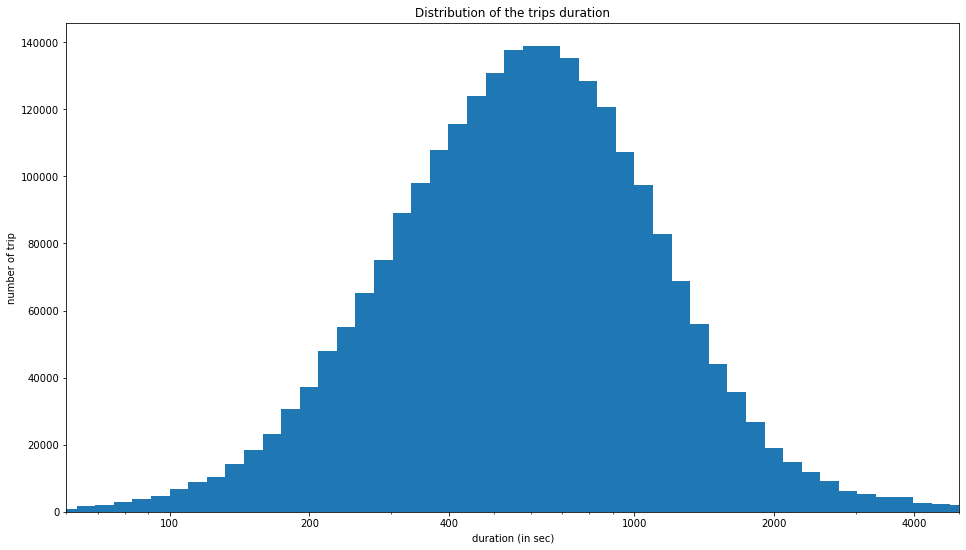

In [6]:
plt.figure(figsize=(16,9))
bins_edges = 10**np.arange(0, np.log10(df_bike['duration_sec']).max()+0.04,0.04)
plt.hist(data= df_bike, x='duration_sec', bins= bins_edges)
ticks=[100, 200, 400, 1000, 2000, 4000 ]
labels = ['{}'.format(i) for i in ticks]
plt.xscale('log')
plt.xlim(60, 5000)
plt.xticks(ticks, labels)
plt.xlabel('duration (in sec)')
plt.ylabel('number of trip')
plt.title('Distribution of the trips duration');

> The scale of the variable using the log function shows to us a normal distributed curve. with a pick of 140.000 travels lasting between 8 minutes and 13 minutes.

##### Distance:

<ipython-input-7-7a90956ccf20>:10: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  plt.xlim([0,8])


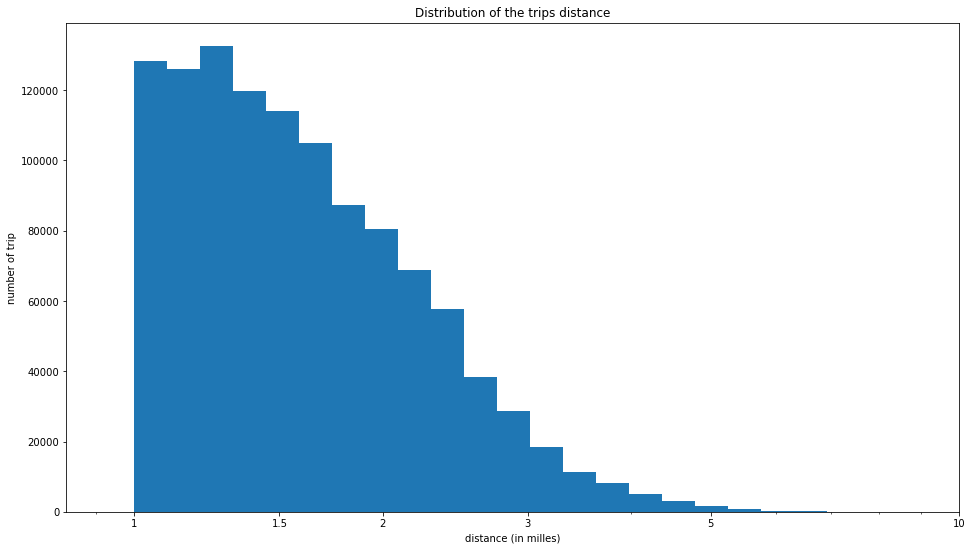

In [7]:
plt.figure(figsize=(16,9))
bins_edges = 10**np.arange(0, np.log10(df_bike['distance_milles']).max()+0.04,0.04)
plt.hist(data=df_bike, x='distance_milles', bins=bins_edges)

ticks=[1, 1.5, 2, 3, 5, 10 ]
labels = ['{}'.format(i) for i in ticks]

plt.xscale('log')

plt.xlim([0,8])
plt.xticks(ticks, labels)
plt.xlabel('distance (in milles)')
plt.ylabel('number of trip')
plt.title('Distribution of the trips distance');

> the distribution of the distance traveled by bike is according to what we expected. a left squeded distribution. with the pick of the distance traveled in less than 1.5 milles.

### *qualitatives variables:*

> *to avoid repetitive plot coding we made a function called `barchar` with 4 inputs(dataframe, categorical column, the order if it were requiered, and the angle of the xtcks). we will use it to have a better look of the categorical variables*

In [8]:
def barchar(df, cat_var, order_list=None, rot=None, hue=None):

    plt.figure(figsize=(16,9))
    base_color = sns.color_palette()[0]
    sns.countplot(data= df, x=cat_var, hue=hue, color=base_color, order=order_list)

    #add annotations
    n_diamonds = df.shape[0]
    diams_count = df[cat_var].value_counts()
    locs, labels = plt.xticks()
    plt.title(f'{cat_var}', fontsize=20)
    plt.xticks(rotation=rot);


    #loop trough each pair of locations and labels

    for loc, label in zip(locs, labels):

        #get the text property for the label to get the correct count
        count = diams_count[label.get_text()]
        pct_string = '{:0.1f}%'.format(100*count/n_diamonds)

        #print the annotations just below the top of the bar
        plt.text(loc, count-(count/20), pct_string, ha = 'center', color = 'w');

##### days of the week:
> by comparing the days of the week we can have a big picture of the propuses and types of the travels. let's check with the barchar function, and extracting this time data from the variables that we correct in prior steps.

In [9]:
day_week={0:'Monday', 1:'Tuesday', 2:'Wednesday', 3:'Thursday', 4:'Friday', 5:'Saturday', 6:'Sunday'}
df_bike['start_day'] = df_bike.start_time.dt.dayofweek.astype(str)
df_bike['end_day'] = df_bike.end_time.dt.dayofweek.astype(str)

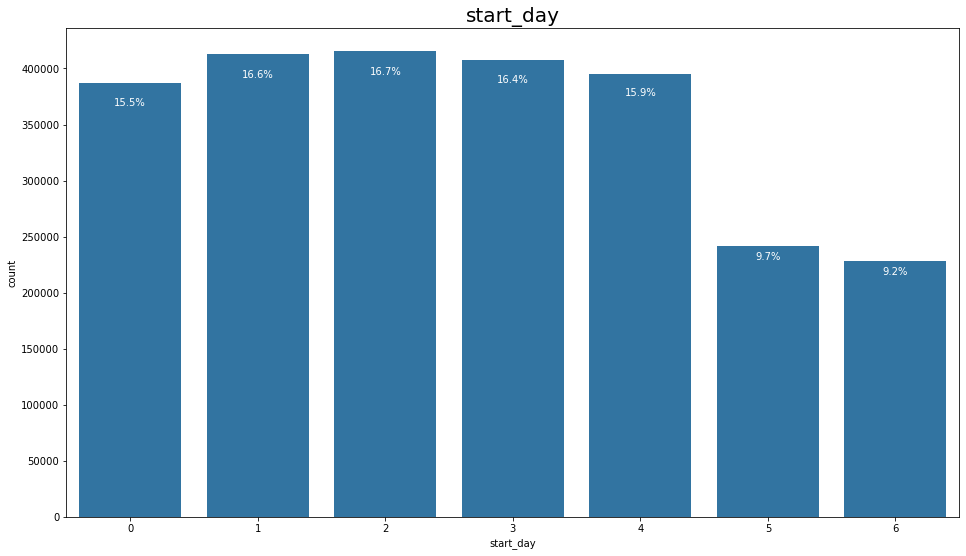

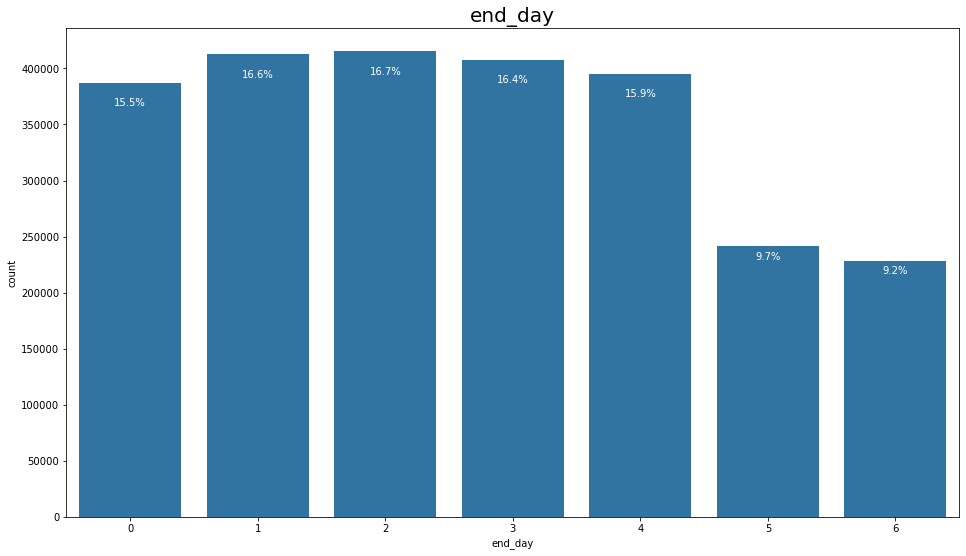

In [10]:
barchar(df_bike, 'start_day')
barchar(df_bike, 'end_day')

> In both cases, the number of trips during the weekend is reduced. In Monday, Friday it also has a slight decrease in the number of trips compared to the other days of the week. This may be due to the growth of the home office, or also to the transfer to the second residences in the suburbs of the city, directly after to end and/or to start the week.

##### houer of the day:
> to have a knoledge of the hour of the travels is a great advantage not just to build a redistribution system of the bikes but also to have a general picture of the city transit.

In [11]:
df_bike['start_hour'] = df_bike.start_time.dt.hour.astype(str).str.zfill(2)
df_bike['end_hour'] = df_bike.end_time.dt.hour.astype(str).str.zfill(2)


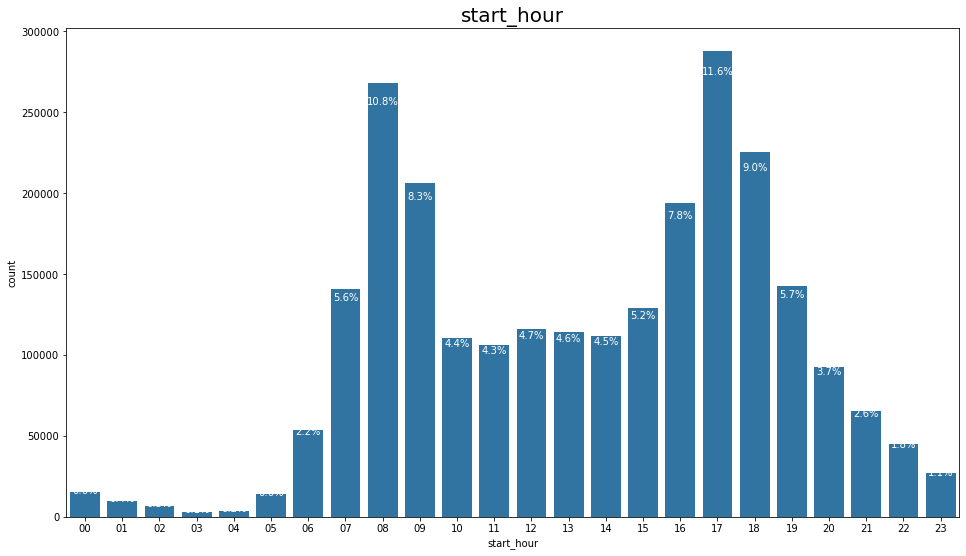

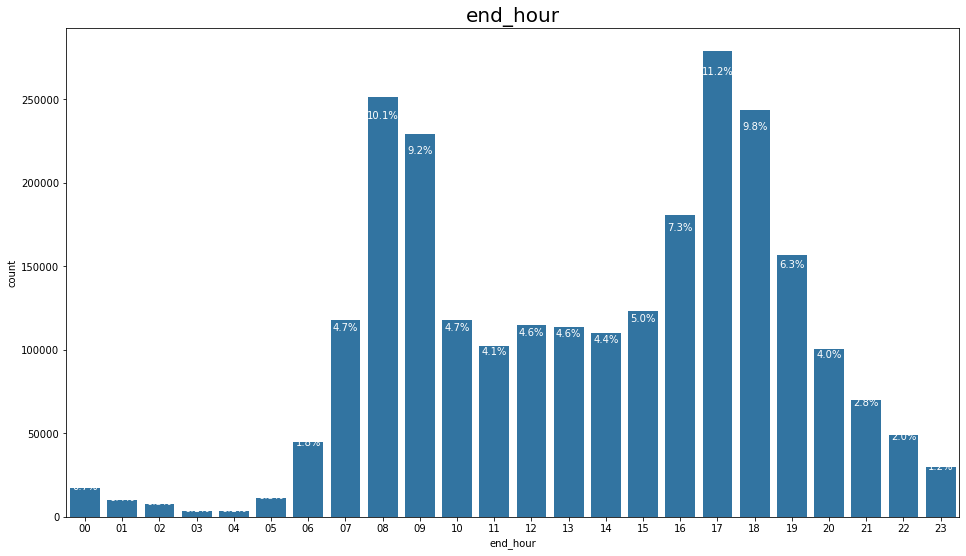

In [12]:
barchar(df_bike, 'start_hour')
barchar(df_bike, 'end_hour')

> We observe that during rush hour, between 8 and 10 in the morning and between 17 and 19 at night, 40% of the trips happen. We can say that it is a transport service widely used to run daily commutes from home-work or educational center. This indicates to us that San Francisco has a well connected bike-network that does not affect the duration of the trips and ensures users good performances.

##### Popular Station:
> the firs spatial approach that we can do is with the station names. let's see witch ones are the most required stations

to perform this plot we need to transform the database and melt boths start_station_name and end_station_name to count the total number of trips that start or ends in each point.

In [13]:
# melt function to colapse the tow stations columns
df_bike_stations = pd.melt(df_bike, id_vars=['duration_sec', 'distance_milles', 'start_time', 'end_time', 'start_station_id',
                                             'start_station_latitude', 'start_station_longitude', 'end_station_id',
                                             'end_station_latitude', 'end_station_longitude', 'bike_id', 'user_type',
                                             'bike_share_for_all_trip', 'rental_access_method','start_hour', 
                                             'end_hour', 'start_day', 'end_day'], var_name='station_type', value_name= 'station_name')


In [14]:
df_bike_stations.head()

,duration_sec,distance_milles,start_time,end_time,start_station_id,start_station_latitude,start_station_longitude,end_station_id,end_station_latitude,end_station_longitude,bike_id,user_type,bike_share_for_all_trip,rental_access_method,start_hour,end_hour,start_day,end_day,station_type,station_name
0,4235,0.407242,2019-05-31 23:05:48.932,2019-06-01 00:16:24.457,34.0,37.783988,-122.412408,368.0,37.785434,-122.419622,181,Subscriber,No,NaN,23,00,4,5,start_station_name,Father Alfred E Boeddeker Park
1,2954,1.815976,2019-05-31 23:26:52.812,2019-06-01 00:16:07.725,50.0,37.780526,-122.390288,6.0,37.804770,-122.403234,3264,Customer,No,NaN,23,00,4,5,start_station_name,2nd St at Townsend St
2,3071,1.815976,2019-05-31 23:24:40.250,2019-06-01 00:15:51.303,50.0,37.780526,-122.390288,6.0,37.804770,-122.403234,1566,Customer,No,NaN,23,00,4,5,start_station_name,2nd St at Townsend St
3,924,1.133369,2019-05-31 23:58:16.112,2019-06-01 00:13:40.588,324.0,37.788300,-122.408531,50.0,37.780526,-122.390288,1649,Subscriber,No,NaN,23,00,4,5,start_station_name,Union Square (Powell St at Post St)
4,696,0.960383,2019-05-31 23:57:58.130,2019-06-01 00:09:35.077,22.0,37.789756,-122.394643,81.0,37.775880,-122.393170,2832,Subscriber,No,NaN,23,00,4,5,start_station_name,Howard St at Beale St


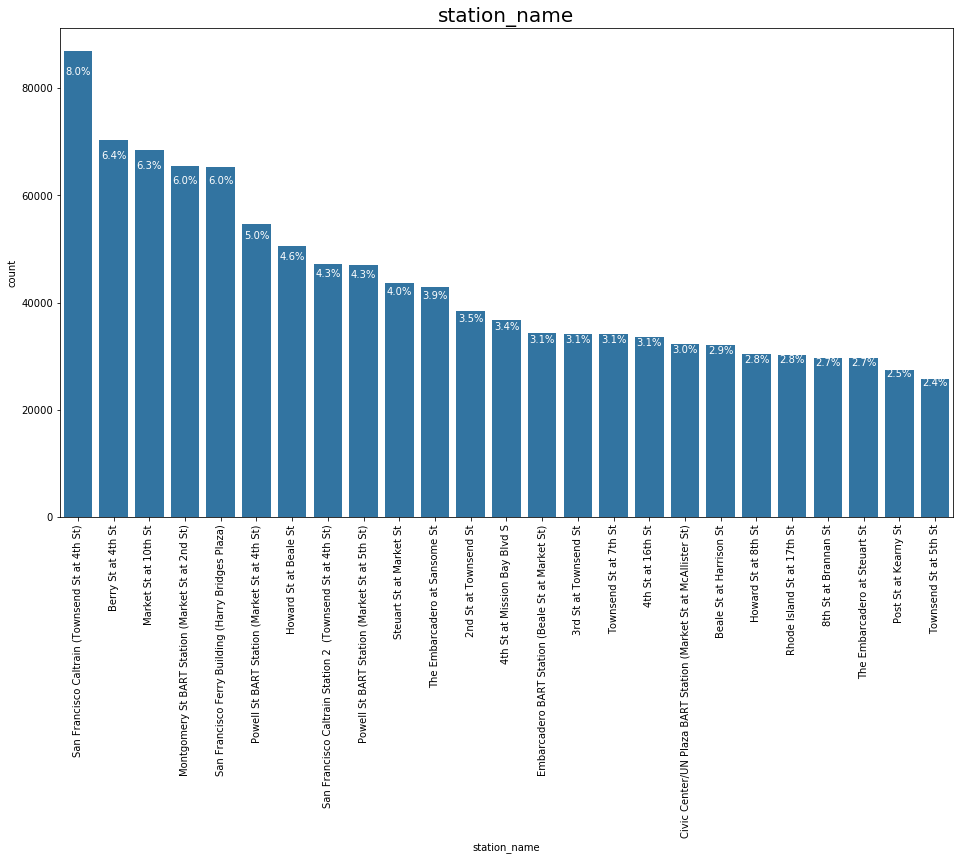

In [15]:
# index of the most counted stations in the prior dataframe will be the advance filtered use to focus on the top 25 stations.
top_25_stations = list(df_bike_stations.station_name.value_counts().head(25).index)
df_top_25 = df_bike_stations.loc[df_bike_stations.station_name.isin(top_25_stations)]

barchar(df_top_25, 'station_name', top_25_stations, 90)

> this 25 stations are involve in more than a millon of travels in the last ten months. the number of bikes that are in circulation between only this 25 stations is amazing.  with more than 80.000 travels San Francisco Caltrain (townsend st at 4th st) is the most requiered station in the San Francisco bay.

##### User Types:

> because the price of each type of user is different, it is an interesting variable to relate with the other ones. Even if we don't have it this variable will be a ceoffecient really usefull to set the prices of the enrollement.

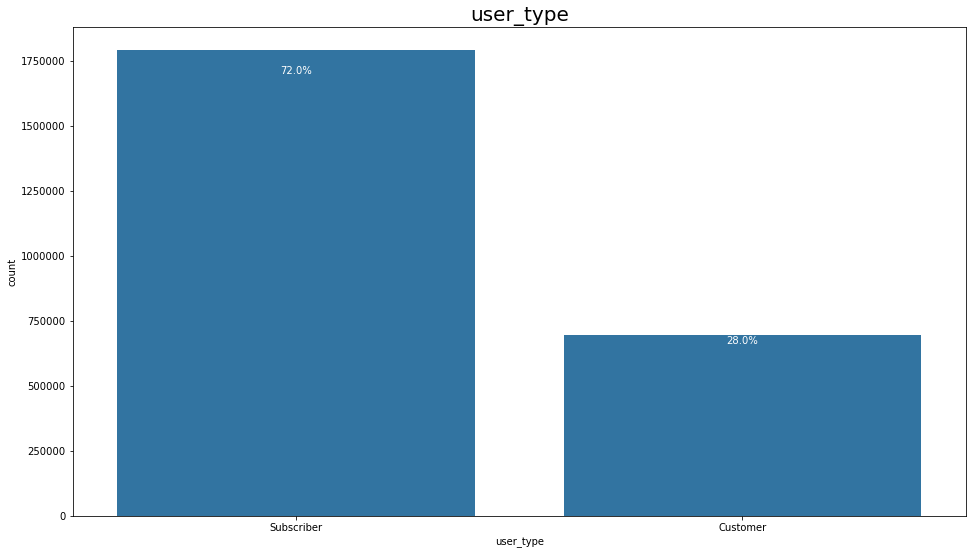

In [16]:
barchar(df_bike, 'user_type')


> In parallel with what we saw previously, 70% of users are subscribed, that is, they have this service on a daily basis

### Discuss the distribution(s) of your variable(s) of interest. Were there any unusual points? Did you need to perform any transformations?

> The variables of interest, duration of the journey and distance traveled have expected distributions. the duration of the trips should be scaled with the log function, in order to obtain a normal distribution that had its peak between 8 and 10 minutes. instead the distance presents a left squeded curve, to obtain these results it had to be scaled as well. This variable was obtained as a result of performing the distance function of geopy. With these variables we can not only understand the rhythm of the transfers but also what type of routes users are taking.  

### Of the features you investigated, were there any unusual distributions? Did you perform any operations on the data to tidy, adjust, or change the form of the data? If so, why did you do this?

> Regarding the types of users, we find a reasonable difference between the use of subscribers and customres.
We use the melt function to understand which are the most popular stations and collect the efonque at the first 25.
which are the most frequented, which stations have the largest exchange of bikes.
To finish the "univariate time series" they show us on different scales the temporal distribution of the use that is given to the bicycle sharing service

## Bivariate Exploration

> In this section, investigate relationships between pairs of variables in your
data. Make sure the variables that you cover here have been introduced in some
fashion in the previous section (univariate exploration).

##### *Distance:*

> We can begin by studying how the use of the city's public bicycle service varies. With the records of the last 10 months (the year was not completed because it contained files in poor condition). For this we can make a time series with the distance traveled per month.

In [17]:
# month yer 
#per = df.Date.dt.to_period("M").agg({'B': ['min', 'max'], 'C': 'sum'})
df_bike['month_period'] = df_bike.start_time.dt.to_period('M')
df_bike_period = df_bike.groupby(by='month_period').agg({'distance_milles' : 'sum',
                                        'duration_sec' : 'sum'}).reset_index()

df_bike_period['month_period'] = df_bike_period['month_period'].dt.strftime('%Y-%m')

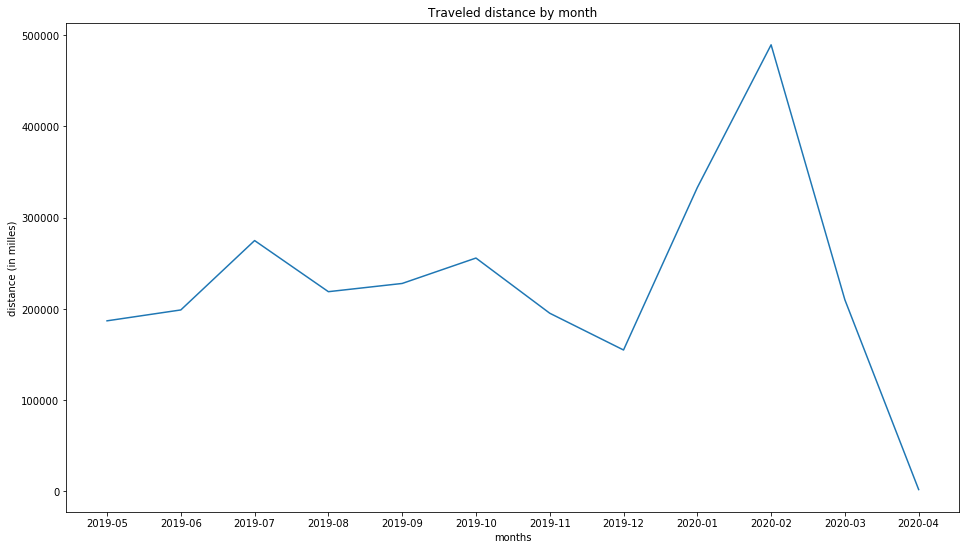

In [18]:
plt.figure(figsize=(16,9))
sns.lineplot(x='month_period', y="distance_milles", data=df_bike_period)
plt.title('Traveled distance by month')
plt.xlabel('months')
plt.ylabel('distance (in milles)');

> With this curve we can see how current events have had an impact on people's mobility. We refer to the impact of the pandemic as of February 2020. The tremendous increase in miles traveled has been abruptly interrupted by COVID-19 and the respective suspension of service. 500,000 miles traveled per month to 0 miles in less than two months.
In short, this curve, more than the evolution of the use of the public bicycle network, shows us the impact of the pandemic, and the response of citizens.

#### *Distance and duration of the travels:*

> to mesure this tow variables lets use a scatter plot.

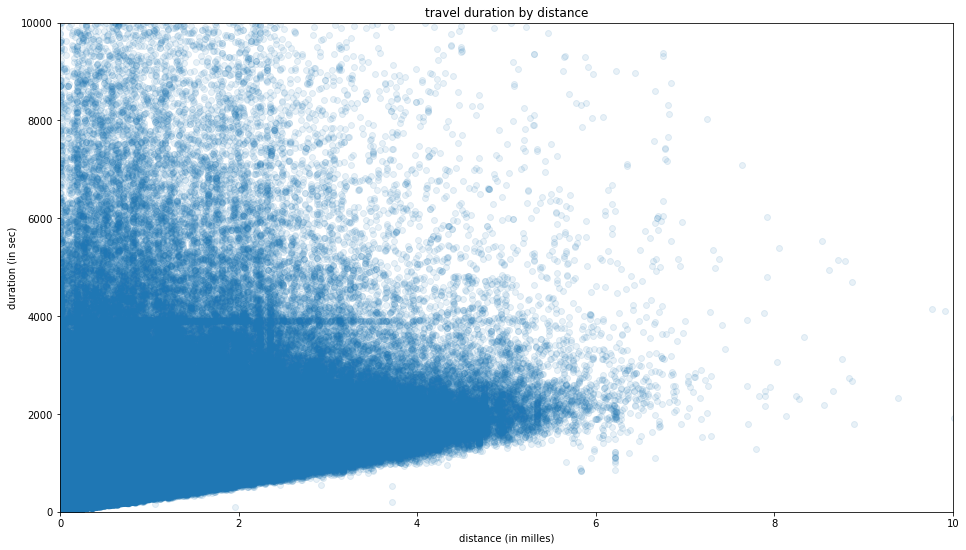

In [19]:
plt.figure(figsize=(16,9))
plt.scatter(data=df_bike, x='distance_milles', y='duration_sec', alpha=1/10)
plt.title('travel duration by distance')
plt.xlabel('distance (in milles)')
plt.ylabel('duration (in sec)')
plt.xlim(0, 10)
plt.ylim(0, 10000);

> As we presumed, this plot shows a positive correlation in the maximum velocities. however, it is very noisy and the overlapping of the points cannot be seen. Let's try to present these variables with a heatmap and a line plot with std to get better insights.

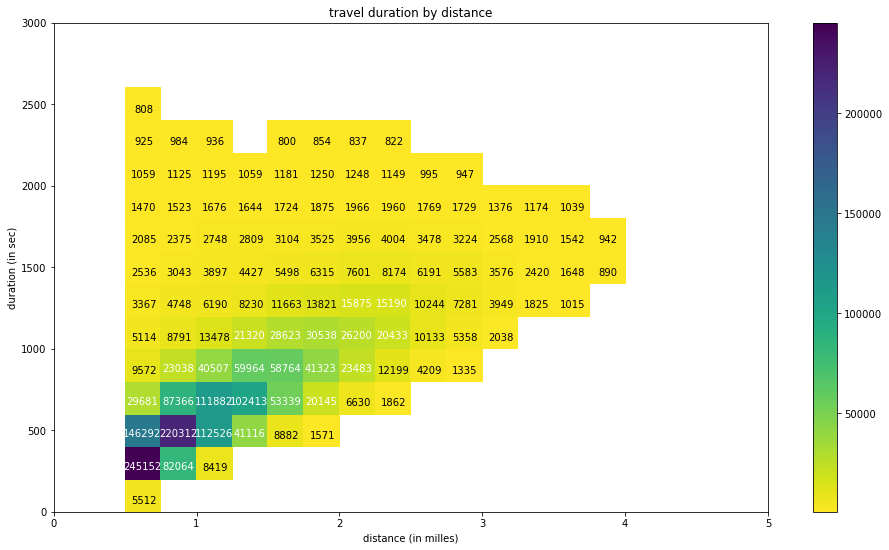

In [20]:
plt.figure(figsize=(16,9))
bins_x = np.arange(0.5, 8+0.25, 0.25)
bins_y = np.arange(-0.5, 10600+200, 200)
h2d = plt.hist2d(data = df_bike, x = 'distance_milles', y = 'duration_sec',
           bins = [bins_x, bins_y], cmap = 'viridis_r', cmin = 800)
plt.title('travel duration by distance')
plt.xlabel('distance (in milles)')
plt.ylabel('duration (in sec)')
plt.xlim(0,5)
plt.ylim(0,3000)
plt.colorbar()

counts = h2d[0]

# loop through the cell counts and add text annotations for each
for i in range(counts.shape[0]):
    for j in range(counts.shape[1]):
        c = counts[i,j]
        if c >= 15000: # increase visibility on darkest cells
            plt.text(bins_x[i]+0.12, bins_y[j]+80, int(c),
                     ha = 'center', va = 'center', color = 'white')
        elif c > 0:
            plt.text(bins_x[i]+0.13, bins_y[j]+70, int(c),
                     ha = 'center', va = 'center', color = 'black')

Text(0, 0.5, 'duration in seg')

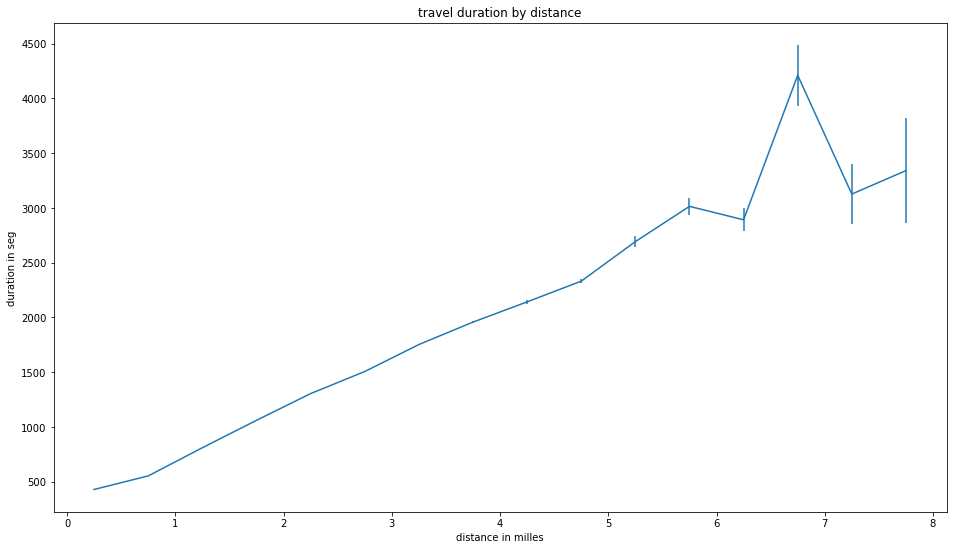

In [21]:
#set bins edges, compute center
plt.figure(figsize=(16,9))
bin_size = 0.5
xbin_edges = np.arange(0, 8+bin_size, bin_size)
xbin_centers = (xbin_edges + bin_size/2)[:-1]

#compute statistics in each bin
data_xbins = pd.cut(df_bike['distance_milles'], xbin_edges, right= False, include_lowest=True)
y_means= df_bike['duration_sec'].groupby(data_xbins).mean()
y_sems = df_bike['duration_sec'].groupby(data_xbins).sem()

#plot the summarized data
plt.errorbar(x = xbin_centers, y = y_means, yerr = y_sems)
plt.title('travel duration by distance')
plt.xlabel('distance in milles')
plt.ylabel('duration in seg')

> Despite the noise of the scatterplot, both the heatmap and the lineplot confirm a strong correlation between the distance and the duration of the journey for the first few miles.
From the sixth mile, we observe a reduction in the speed of the routes. This may be due to commuting, poor infrastructure for non-motor vehicles
the fact that the curve drops again may be indicating inter-urban routes that have fewer road interruptions such as traffic lights or roundabouts, which allow speeding up the circulation times between points within the city

#####  Travel by hour of the day:

> From the previous plots, we can mention the average speed of cycling in the bay of San Francisco. An interesting analysis is to contemplate the oscillations of this variable throughout the hours of the day. The reduction of speeds will indicate the most congested moments of the day as well as which are the most appropriate to use the bicycle.

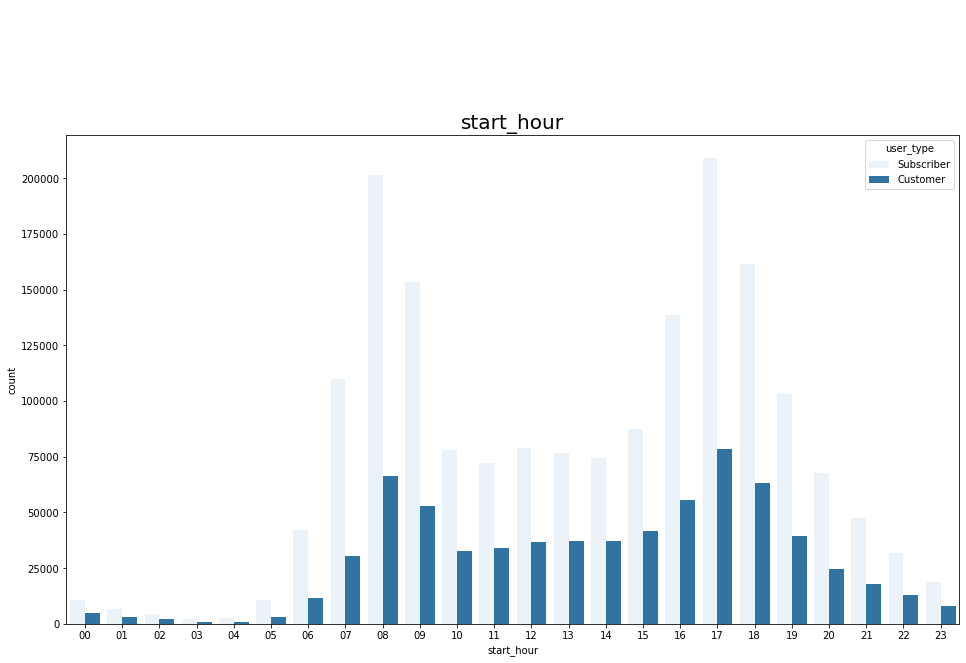

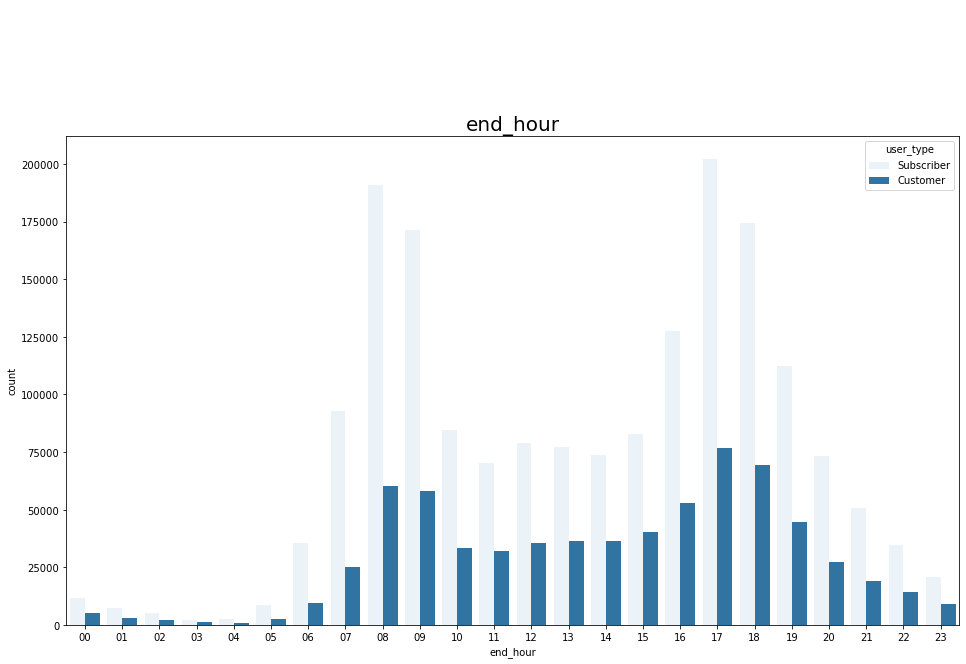

In [40]:
barchar(df_bike, 'start_hour', None, None, 'user_type')
barchar(df_bike, 'end_hour', None, None, 'user_type')

> The relationship between subscribed users and cutomers changes throughout the daylight hours. in rush hour periods, subscripts almost tripled in number of trips, however in the intermediate period this difference is considerably reduced. and in both it coincides with minimum values during the night period.

In [22]:
# generate the speed variable, using the formula s=dist/Time. to have it in MPH we multiply the quotient it by 3600

df_bike['speed_mph'] = df_bike['distance_milles']/df_bike['duration_sec']*3600

In [23]:
# tow speed values of more that 60mph need to be removed. even if they are true, tha speed is ilegal.

df_bike = df_bike.loc[df_bike.speed_mph<40]

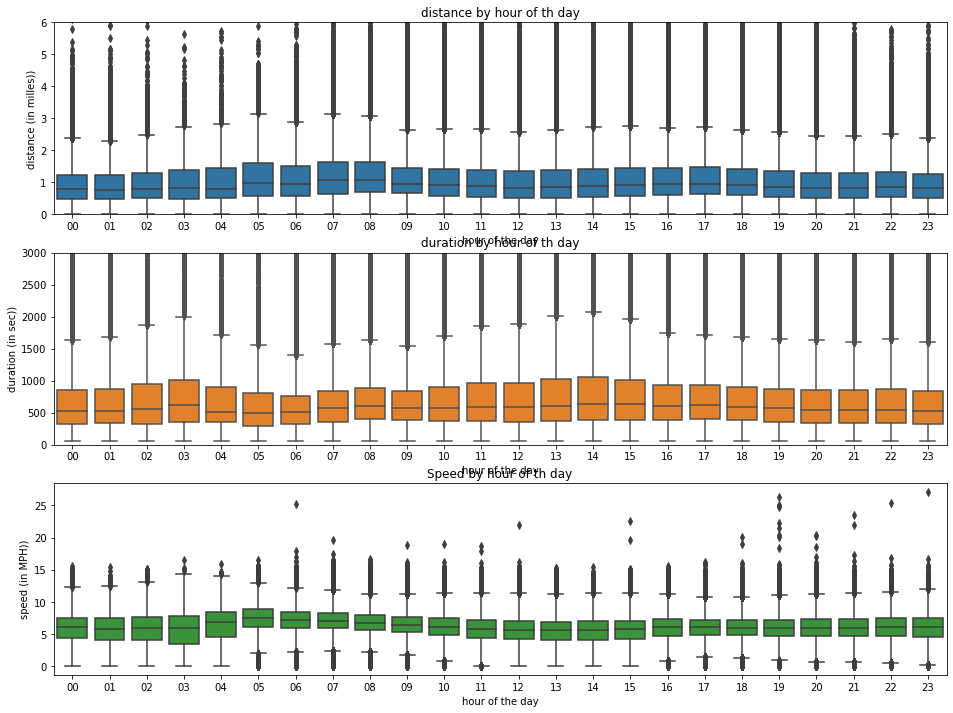

In [24]:
plt.figure(figsize=(16,12))


# subplot 1: distance vs hour

plt.subplot(3, 1, 1)
base_color = sns.color_palette()[0]
sns.boxplot(data = df_bike, x = 'start_hour', y = 'distance_milles', color = base_color)
plt.ylim(0,6)
plt.title('distance by hour of th day')
plt.ylabel('distance (in milles))')
plt.xlabel('hour of the day');

# subplot 2: duration vs hour

plt.subplot(3, 1, 2)
base_color = sns.color_palette()[1]
sns.boxplot(data = df_bike, x = 'start_hour', y = 'duration_sec', color = base_color)
plt.ylim(0,3000)
plt.title('duration by hour of th day')
plt.ylabel('duration (in sec))')
plt.xlabel('hour of the day');

# subplot 3: speed vs. hour

plt.subplot(3, 1, 3)
base_color = sns.color_palette()[2]
sns.boxplot(data = df_bike, x = 'start_hour', y = 'speed_mph', color = base_color)
plt.title('Speed by hour of th day')
plt.ylabel('speed (in MPH))')
plt.xlabel('hour of the day');


> The average distance traveled in the city is one mile. definitely the public network of bikes, are used as an intercity vehicle. We can refer to the transfer of the last mile.  
also the duration of the matches coincides. With medians of less than 8 minutes.  
the highest speeds occur at 5 a.m., but generally speaking a constant speed of between 6 and 7 mph is achieved. This indicates that the rush hour traffic congestion does not affect the urban bicycle circuit.

##### Station by user type:

> Segmenting the use of the customer with that of the subscriber, we can study whether the tourist circuit and the local overlap in the use of the stations. an increase in the proportion of user types customer would indicate this.
In the ferry station in the bay we note that there is an approach between the values, as in Embarcadero. Seeing them represented over time could tell us if these characteristics are compromising the availability of bicycles.

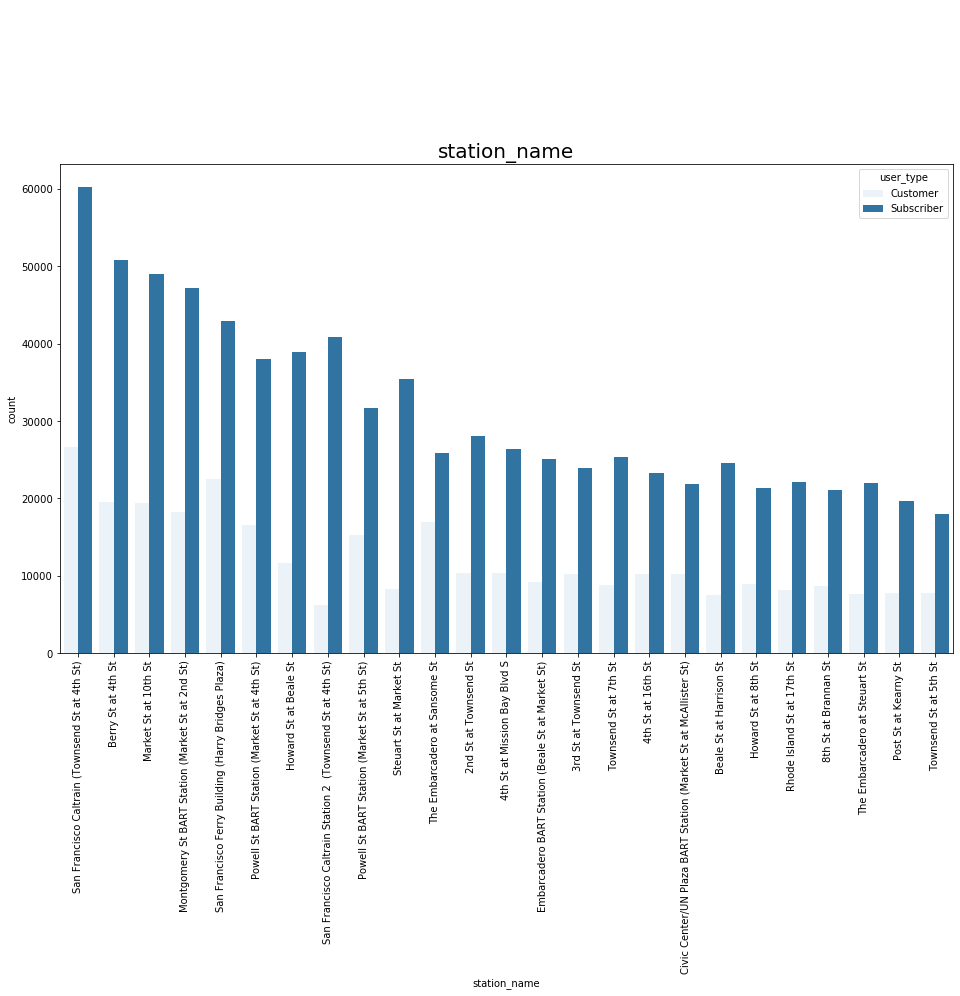

In [25]:
barchar(df_top_25, 'station_name', top_25_stations, 90, 'user_type')

> The San Francisco Caltrian station is the most popular for both types of users. it has a very functional position to complete transfers within the city

##### HeatMap:

> using the georeferenced data we can visualize where the stations are. The heatmap presents the intensity of bicycle use in a range of colors. 
the folium tool allows us to do this in an interactive way throughout the planisphere

In [26]:
import geojson
import folium
from folium import plugins
from folium.plugins import HeatMap

In [27]:
mapa = folium.Map(location=[37.8068, -122.3807],
                   zoom_start=11.5,
                tiles='cartodbpositron')

heat_df = df_bike.sample(40000)
heat_df = heat_df[['start_station_latitude', 'start_station_longitude']]

heat_data = [[row['start_station_latitude'], row['start_station_longitude']] for index, row in heat_df.iterrows()]
                  
mapa.add_child(HeatMap(heat_data))
                  
                  
mapa


> The main advantage of folium is that it is interactive and you can adjust the zoom according to what you want to see. This heatmap represents a sample of the total distance traveled and shows us how it concentrates on three very clear points. The northeast sector of San Francisco, Emeryvil and San Jose.

##### Starting station and Endind station locations

> Most of the trips are concentrated in the rush hour. Within this time spectrum, most of the communication routes of the city are saturated. Let us observe which are the routes that predominate in the periods from 8 am to 9 am and from 5 pm to 6 pm.

In [28]:
m = folium.Map(location=[37.8068, -122.3807],
               zoom_start=11.5,
            tiles='cartodbpositron')


df_morning = df_bike[df_bike.start_hour=='08']

for index, row in df_morning.sample(500).iterrows():
    folium.CircleMarker(location=[row['start_station_latitude'],row['start_station_longitude']],
                         #radius=radi,
                         color="#0A8A9F",
                         popup='star station',
                         fill=True).add_to(m)
    
    folium.CircleMarker(location=[row['end_station_latitude'],row['end_station_longitude']],
                         #radius=radi,
                         color="#E37222",
                         popup='end station',
                         fill=True).add_to(m)
m      

In [29]:
m = folium.Map(location=[37.8068, -122.3807],
               zoom_start=11.5,
            tiles='cartodbpositron')

df_morning = df_bike[df_bike.start_hour=='17']

for index, row in df_morning.sample(500).iterrows():
    folium.CircleMarker(location=[row['start_station_latitude'],row['start_station_longitude']],
                         #radius=radi,
                         color="#0A8A9F",
                         popup='star station',
                         fill=True).add_to(m)
    
    folium.CircleMarker(location=[row['end_station_latitude'],row['end_station_longitude']],
                         #radius=radi,
                         color="#E37222",
                         popup='end station',
                         fill=True).add_to(m)
    
m

> Comparing both planes we can see how the type of station is inverted. those that in the morning are a starting point mostly at night are a destination. In San Francisco these trslados happen from the interior to the east coast, and then reverse in the afternoons.

### Talk about some of the relationships you observed in this part of the investigation. How did the feature(s) of interest vary with other features in the dataset?

> Despite the noise, we can see a strong positive correlation between the distance and the duration of the tours. Throughout the day, the variables of distance, duration and speed seem stable. as we had seen the displacements are distributed within 3 areas

### Did you observe any interesting relationships between the other features (not the main feature(s) of interest)?

> As we have seen, displacements are distributed within 3 areas.

## Multivariate Exploration

> Create plots of three or more variables to investigate your data even
further. Make sure that your investigations are justified, and follow from
your work in the previous sections.

##### Travels in the day by user type

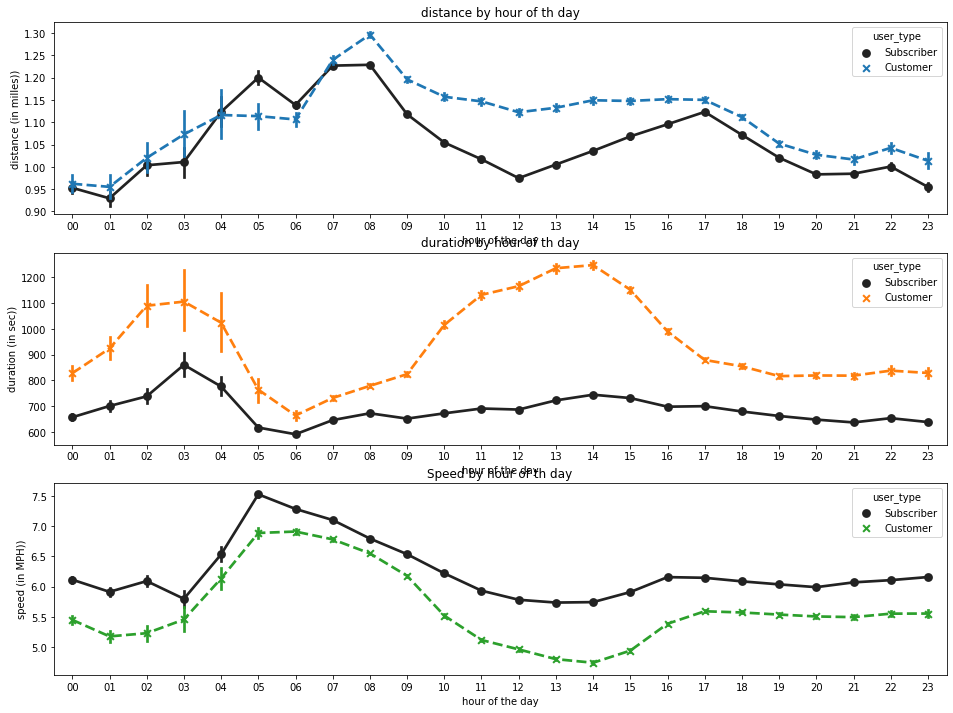

In [30]:
plt.figure(figsize=(16,12))


# subplot 1: distance vs hour

plt.subplot(3, 1, 1)
base_color = sns.color_palette()[0]
sns.pointplot(data = df_bike, x = 'start_hour', y = 'distance_milles', hue='user_type',
              color = base_color, 
              markers=["o", "x"], 
              linestyles=["-", "--"])

plt.title('distance by hour of th day')
plt.ylabel('distance (in milles))')
plt.xlabel('hour of the day');

# subplot 2: duration vs hour

plt.subplot(3, 1, 2)
base_color = sns.color_palette()[1]
sns.pointplot(data = df_bike, x = 'start_hour', y = 'duration_sec', hue='user_type', 
              color = base_color, 
              markers=["o", "x"], 
              linestyles=["-", "--"])

plt.title('duration by hour of th day')
plt.ylabel('duration (in sec))')
plt.xlabel('hour of the day');

# subplot 3: speed vs. hour

plt.subplot(3, 1, 3)
base_color = sns.color_palette()[2]
sns.pointplot(data = df_bike, x = 'start_hour', y = 'speed_mph', hue='user_type', 
              color = base_color, 
              markers=["o", "x"],
              linestyles=["-", "--"])
plt.title('Speed by hour of th day')
plt.ylabel('speed (in MPH))')
plt.xlabel('hour of the day');

> both the distance of the tours of the customers and the duration is greater than that of the subscribers. This can be explained because it is not their main means of transport or even because they are using it in a recreational way. However, the speed is higher in the case of subscribed users.  
> around 5 in the morning the average distance traveled by subscribers exceeds that of customers, however, after 9 in the morning their descent is much more abrupt.  
> Regarding the duration we see a considerable increase between 12 and 16 hours among the custumers, these values ​​may indicate tourist or recreational tours.  
> The speeds have some parallelism, with a peak of 7.5 mph on average at 5 in the morning.

##### Heatmap for 

In [32]:
def hist2dgrid(x, y, **kwargs):
  
    palette = kwargs.pop('color')
    bins_x = np.arange(0.5, 8+0.25, 0.25)
    bins_y = np.arange(-0.5, 10600+200, 200)
    plt.hist2d(x, y, bins = [bins_x, bins_y], cmap = palette, cmin = 1000)

<Figure size 1152x648 with 0 Axes>

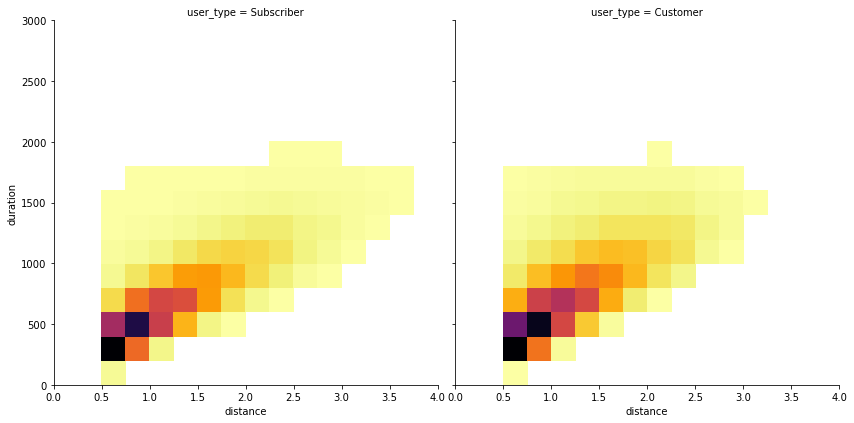

In [33]:
plt.figure(figsize=(16,9))
g = sns.FacetGrid(data = df_bike, col = 'user_type', col_wrap = 2, size = 6, margin_titles=True)
g.map(hist2dgrid, 'distance_milles', 'duration_sec', color = 'inferno_r')
g.set(xlim=(0, 4))
g.set(ylim=(0, 3000))
g.set_xlabels('distance')
g.set_ylabels('duration')




<Figure size 1152x648 with 0 Axes>

<__array_function__ internals>:5: UserWarning: Warning: converting a masked element to nan.
c:\program files\python38\lib\site-packages\numpy\ma\core.py:722: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


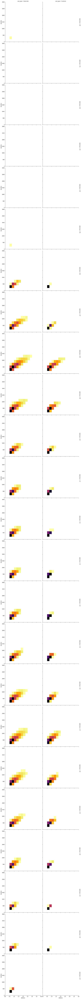

In [34]:
plt.figure(figsize=(16,9))
g = sns.FacetGrid(data = df_bike, col = 'user_type', row='start_hour', size = 6, margin_titles=True)
g.map(hist2dgrid, 'distance_milles', 'duration_sec', color = 'inferno_r')
g.set(xlim=(0, 4))
g.set(ylim=(0, 3000))
g.set_xlabels('distance')
g.set_ylabels('duration')


##### Popular Station use  during the day by user type.

> after having presented the most frequent stations within the city. we want to see how these points behave throughout the day and according to the different types of user.  
This series of barplot records the number of trips that depart from each station throughout the day and the number that arrive at each of the stations.

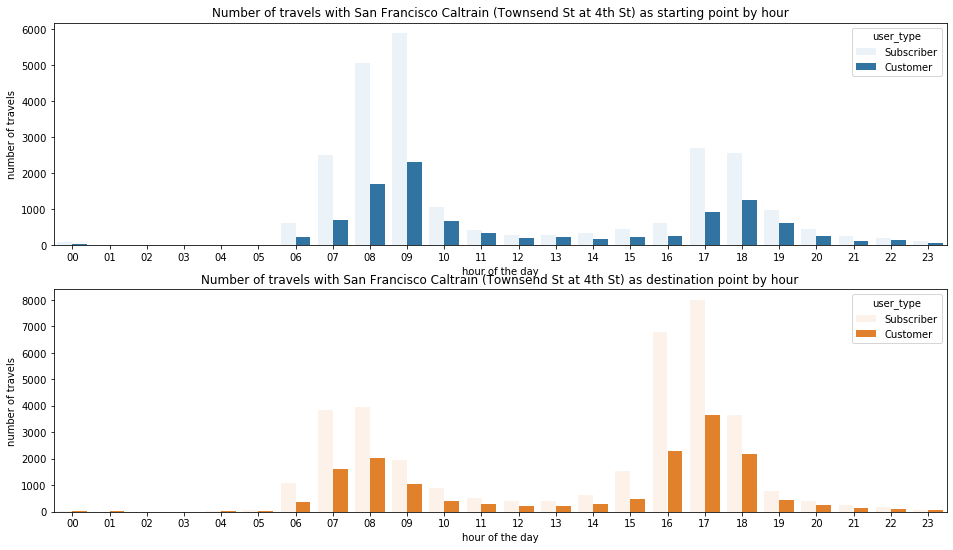

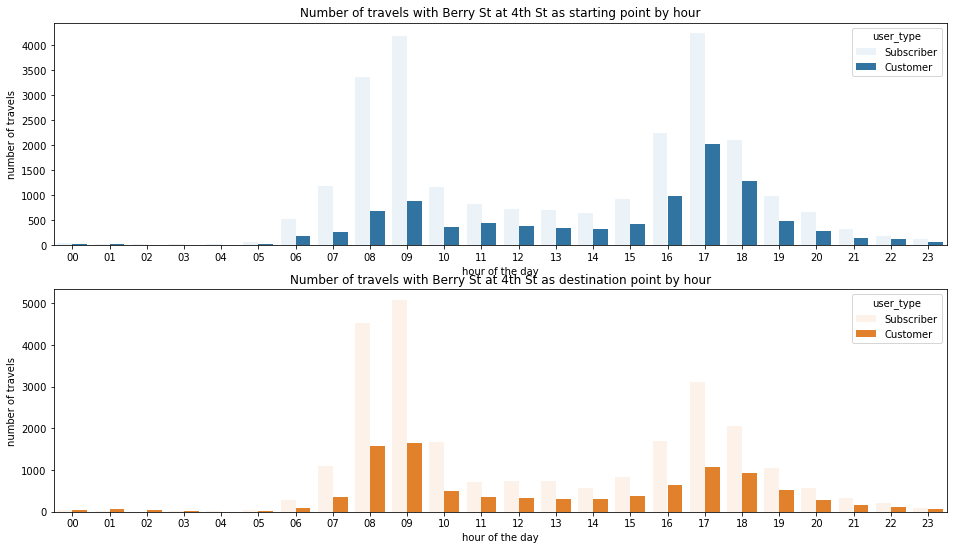

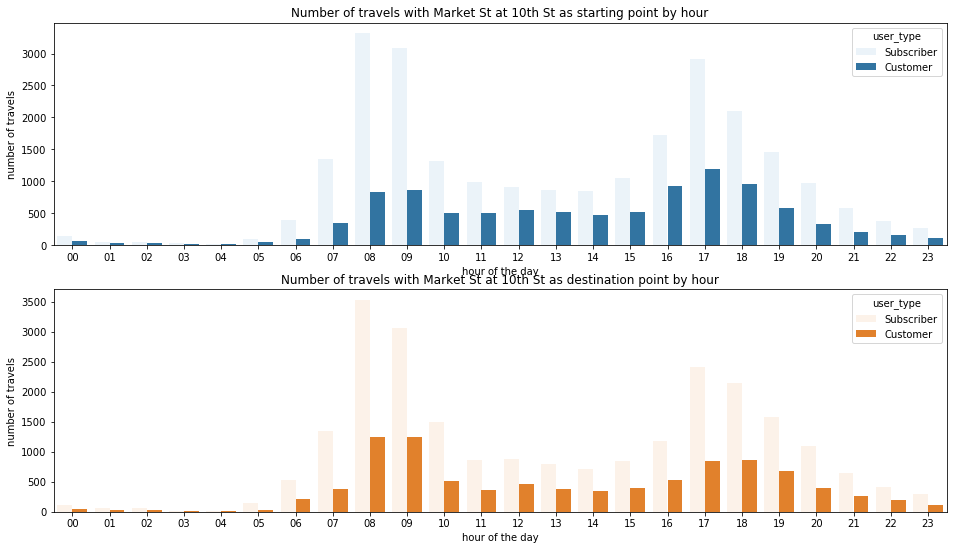

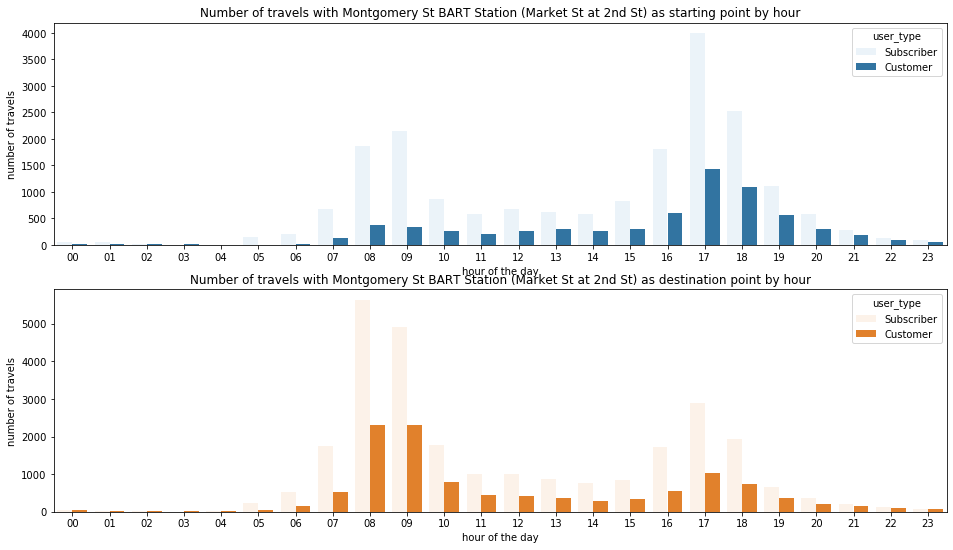

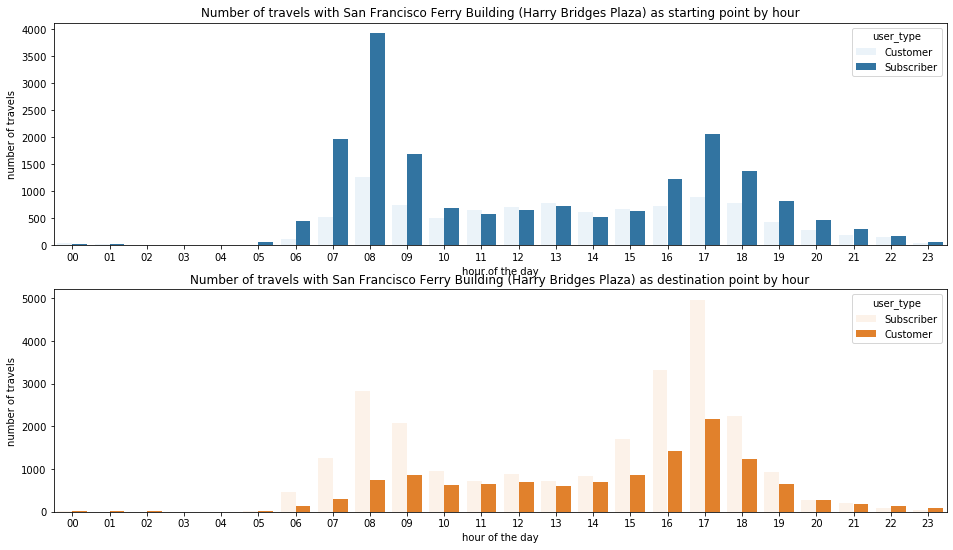

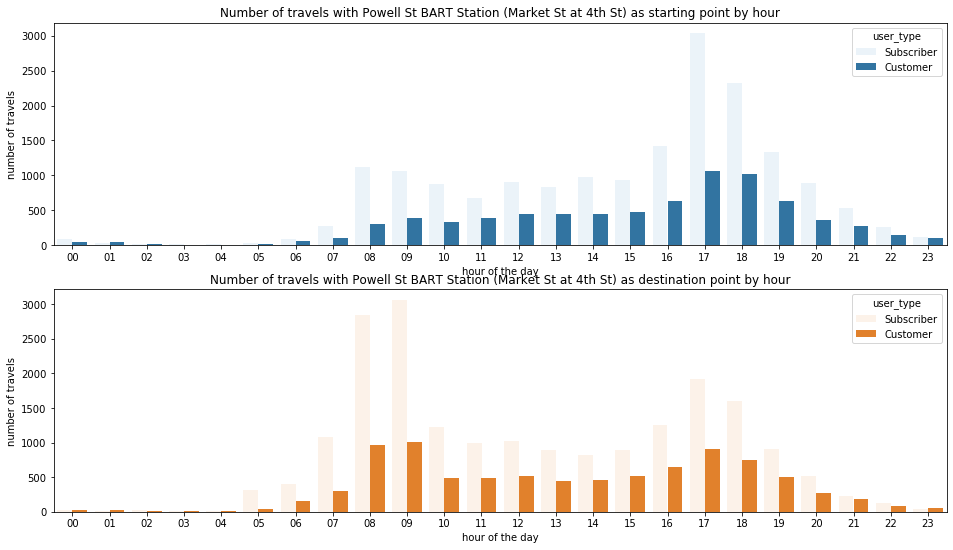

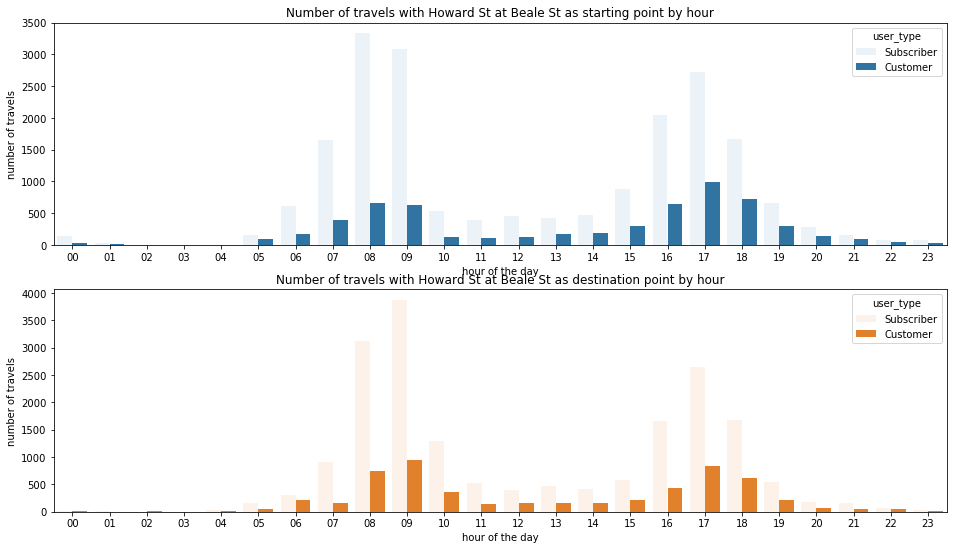

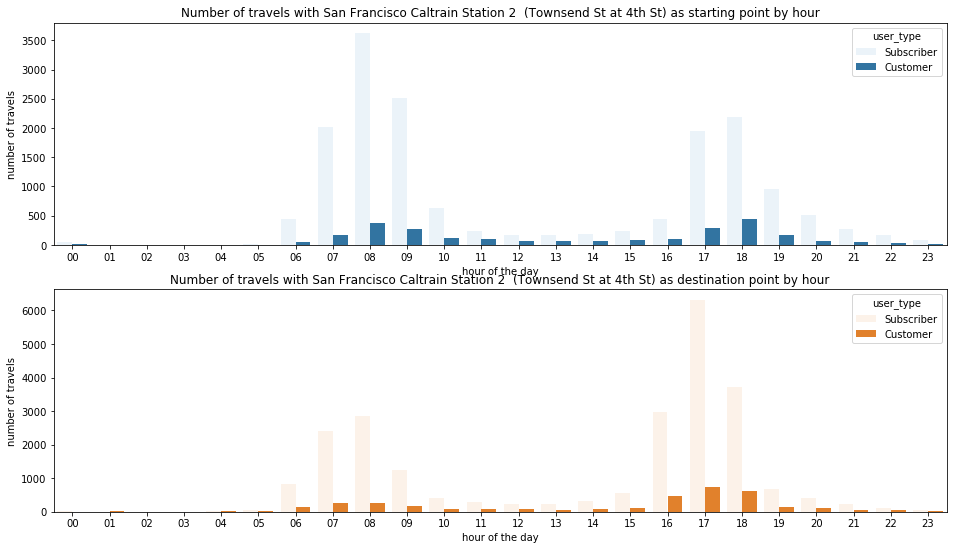

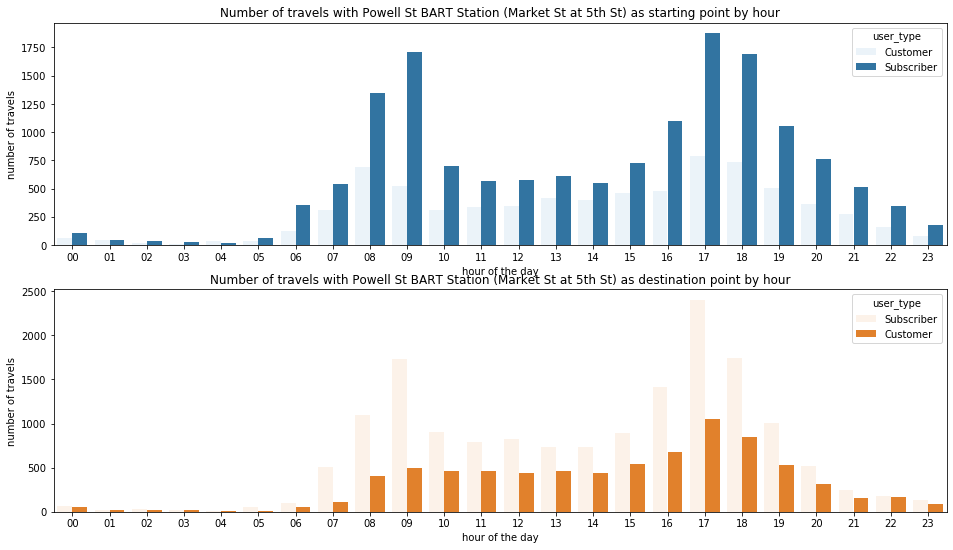

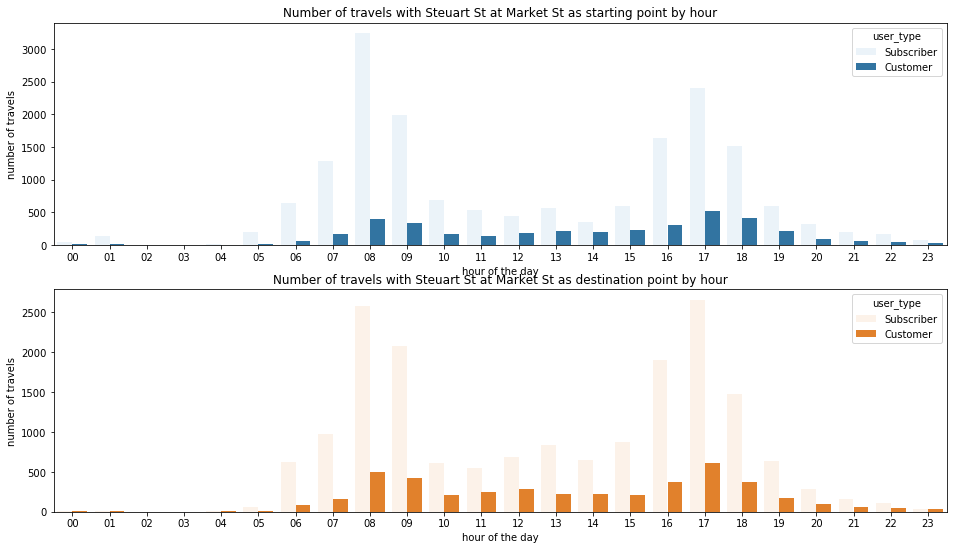

In [35]:
top_10_stations = list(df_bike_stations.station_name.value_counts().head(10).index)

for station in top_10_stations:
    
    df_start_station = df_bike.loc[df_bike['start_station_name']== station]
    df_end_station = df_bike.loc[df_bike['end_station_name']== station]
    
    plt.figure(figsize=(16,9))
    
    plt.subplot(2, 1, 1)
    base_color = sns.color_palette()[0]
    sns.countplot(data = df_start_station, x = 'start_hour', hue = 'user_type', color = base_color)
    plt.title('Number of travels with {} as starting point by hour'.format(station))
    plt.ylabel('number of travels')
    plt.xlabel('hour of the day')
    
    plt.subplot(2, 1, 2)
    base_color = sns.color_palette()[1]
    sns.countplot(data = df_end_station, x = 'end_hour', hue = 'user_type', color = base_color)
    plt.title('Number of travels with {} as destination point by hour'.format(station))
    plt.ylabel('number of travels')
    plt.xlabel('hour of the day')
    



> First we highlight how customers fluctuate less throughout the day.
> the interesting thing about these plots is to see how the peaks of the subscribers work as a mirror. in other words, when a station has many departures one morning, during the afternoon it will receive the respective returns. conversely, the stations in the work areas receive many arrivals in the morning and many departures in the afternoon. It is a great indication of the distribution of land uses and also helps to maintain the correct distribution of bicycles within the network.

##### Timeseries Heatmap:

> el heatmap con time series puede ser un gran recurso para mostrar lo que planteamos anteriormente. podemos construir uno usando la herremienta de folium .

In [36]:
mapa = folium.Map(location=[37.8068, -122.3807],
                   zoom_start=11.5,
                tiles='cartodbpositron')

heat_df = df_bike.sample(45000)
heat_df = heat_df[['start_station_latitude', 'start_station_longitude', 'start_hour']]
day_hour = df_bike['start_hour'].sort_values().unique()

heat_data = [[[row['start_station_latitude'], row['start_station_longitude']] for index, row in heat_df[heat_df['start_hour']==i].iterrows()] for i in day_hour ]
                
                  
hm = plugins.HeatMapWithTime(heat_data,auto_play=True,max_opacity=0.8)
hm.add_to(mapa)
# Display the map
mapa

In [37]:
mapa = folium.Map(location=[37.8068, -122.3807],
                   zoom_start=11.5,
                tiles='cartodbpositron')

heat_df = df_bike.sample(45000)
heat_df = heat_df[['end_station_latitude', 'end_station_longitude', 'end_hour']]
day_hour = df_bike['end_hour'].sort_values().unique()

heat_data = [[[row['end_station_latitude'], row['end_station_longitude']] for index, row in heat_df[heat_df['end_hour']==i].iterrows()] for i in day_hour ]
                
                  
hm = plugins.HeatMapWithTime(heat_data,auto_play=True,max_opacity=0.8)
hm.add_to(mapa)
# Display the map
mapa

### Talk about some of the relationships you observed in this part of the investigation. Were there features that strengthened each other in terms of looking at your feature(s) of interest?

> We observe how the speed, the distance, and the duration of the journeys throughout the day vary according to the type of user. We also decided to locate the distribution of the trips and distinguish the departure points from those of arrival. With these processes we recognized the pendular movement of the populations between certain stations and what are the average values of these routes.

### Were there any interesting or surprising interactions between features?

>It has been interesting how to see how the sahring use of San Francisco is a reflection of the circulation in the city. how it is distributed within 3 sectors. the behavior of different types of user is also a great indication. but what stands out the most is the possibility with the data you have of influencing how to replace the bikes between stations